In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [42]:
df = pd.read_csv("./DATA/DATA.csv")

In [43]:
df.head()

,fw,gl,gh,il,iw,sh,pl,pw,sl,sw,ph,freq,s11,gain,bandwidth
0,1,30,2.4,1.6,1,3.2,28,32,30,40,2.4,13.848,-60.267272,6.701364,0.835132
1,1,30,2.4,1.6,1,3.0,28,32,30,40,2.4,13.818,-46.848643,6.747380,0.808696
2,1,30,2.4,1.6,1,2.8,28,32,30,40,2.4,13.788,-42.183486,6.719528,0.760153
3,1,30,2.4,1.6,1,2.6,28,32,30,40,2.4,13.770,-50.906892,6.834847,0.709741
4,1,30,2.4,1.6,1,2.4,28,32,30,40,2.4,13.740,-51.737495,6.913481,0.649939


In [44]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1559 entries, 0 to 1558
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   fw         1559 non-null   int64  
 1   gl         1559 non-null   int64  
 2   gh         1559 non-null   float64
 3   il         1559 non-null   float64
 4   iw         1559 non-null   int64  
 5   sh         1559 non-null   float64
 6   pl         1559 non-null   int64  
 7   pw         1559 non-null   int64  
 8   sl         1559 non-null   int64  
 9   sw         1559 non-null   int64  
 10  ph         1559 non-null   float64
 11  freq       1559 non-null   float64
 12  s11        1559 non-null   float64
 13  gain       1559 non-null   float64
 14  bandwidth  1559 non-null   float64
dtypes: float64(8), int64(7)
memory usage: 182.8 KB


In [45]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df, random_state=22051662)

In [46]:
train.head()

,fw,gl,gh,il,iw,sh,pl,pw,sl,sw,ph,freq,s11,gain,bandwidth
1542,1,30,0.3,1.6,1,2.0,28,32,30,40,0.7,13.794,-26.161761,8.615805,0.290755
638,1,30,1.5,1.6,1,2.8,28,32,30,40,1.3,13.704,-24.546465,7.817034,0.510094
1346,1,30,0.5,1.6,1,2.8,28,32,30,40,1.5,13.698,-21.228194,8.055079,0.501057
554,1,30,1.7,1.6,1,2.8,28,32,30,40,0.3,13.728,-25.028849,8.775569,0.372176
118,1,30,2.4,1.6,1,1.2,28,32,30,40,0.5,12.426,-23.052310,9.353838,0.201623


In [47]:
test.head()

,fw,gl,gh,il,iw,sh,pl,pw,sl,sw,ph,freq,s11,gain,bandwidth
871,1,30,1.1,1.6,1,1.8,28,32,30,40,2.4,13.710,-21.923957,7.944959,0.420977
514,1,30,1.7,1.6,1,1.2,28,32,30,40,1.1,13.854,-27.608009,8.308376,0.261422
24,1,30,2.4,1.6,1,3.2,28,32,30,40,1.9,13.806,-40.000028,6.842790,0.812980
1507,1,30,0.3,1.6,1,1.8,28,32,30,40,1.3,16.572,-18.656741,8.236506,0.351513
74,1,30,2.4,1.6,1,2.8,28,32,30,40,1.1,13.716,-28.691276,8.288032,0.505874


In [48]:
xcols = ['gh', 'sh', 'ph']
ycols = ['freq', 's11', 'gain']

In [49]:
vis = df[xcols + ycols]

In [50]:
vis.max()

gh       2.400000
sh       3.200000
ph       2.400000
freq    16.692000
s11    -10.306663
gain     9.603192
dtype: float64

In [51]:
vis.min()

gh       0.300000
sh       1.000000
ph       0.100000
freq    12.276000
s11    -60.407930
gain     6.260246
dtype: float64

In [52]:
X_train, X_test = train[xcols].values, test[xcols].values
y_train, y_test = train[ycols].values, test[ycols].values

## DATA VISUALIZATION

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

selected_columns = xcols + ycols
figsize = (15, 10) 

HISTOGRAM

<Figure size 7500x5000 with 0 Axes>

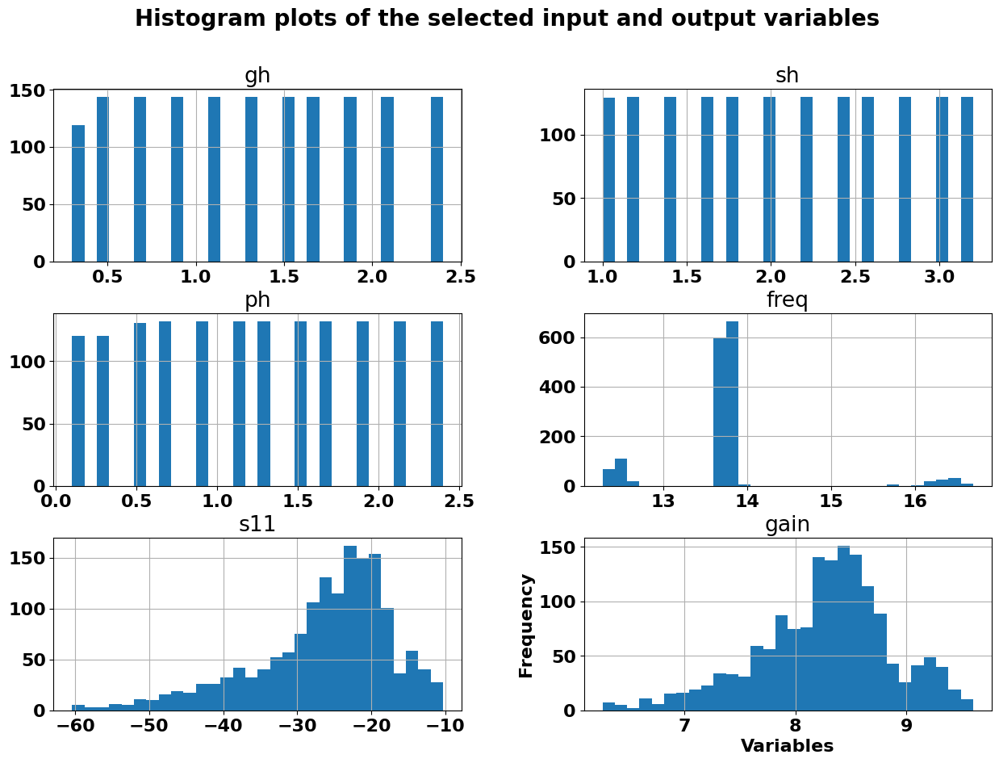

In [54]:
plt.figure(figsize=figsize, dpi=500)
df[selected_columns].hist(bins=30, figsize=figsize)

plt.suptitle('Histogram plots of the selected input and output variables', fontsize=20, fontweight='bold') 
plt.xlabel('Variables', fontsize=16, fontweight='bold') 
plt.ylabel('Frequency', fontsize=16, fontweight='bold') 

for ax in plt.gcf().get_axes():
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')

plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\Histogram.png', dpi=500)
plt.show()

CORRELATION MATRIX

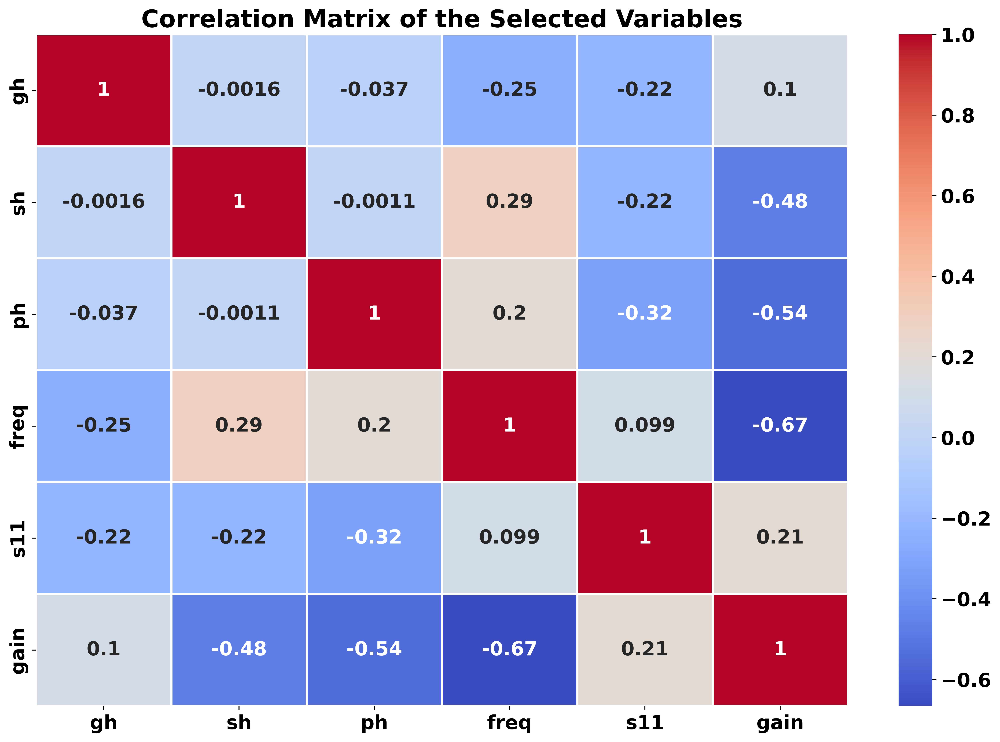

In [55]:
corr_matrix = df[selected_columns].corr()

plt.figure(figsize=figsize, dpi=500)
heatmap = sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=1.5, annot_kws={"size": 16, "weight": "bold"}) 

plt.title('Correlation Matrix of the Selected Variables', fontsize=20, fontweight='bold')
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')

colorbar = heatmap.collections[0].colorbar
colorbar.ax.tick_params(labelsize=16)  
for label in colorbar.ax.get_yticklabels():
    label.set_fontweight('bold') 

plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\CorrelationMatrix.png', dpi=500)
plt.show()

In [56]:
from sklearn.preprocessing import MinMaxScaler

In [57]:
Scaler_X = MinMaxScaler().fit(X_train)
Scaler_Y = MinMaxScaler().fit(y_train)

In [58]:
X_train_scaled = Scaler_X.transform(X_train)
X_test_scaled = Scaler_X.transform(X_test)

y_train_scaled = Scaler_Y.transform(y_train)
y_test_scaled = Scaler_Y.transform(y_test)

In [59]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Input

model = Sequential()

model.add(Input(shape=(X_train_scaled.shape[1],)))
model.add(Dense(27, activation='relu'))
model.add(Dense(81, activation='relu'))
model.add(Dense(243, activation='relu'))
model.add(Dense(81, activation='relu'))
model.add(Dense(3, activation='linear'))

model.compile(
    loss='mean_squared_error', 
    optimizer='adam', 
    metrics=['mae', 'mse', 'accuracy', 'r2_score'],
    jit_compile='auto'
)

model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_5 (Dense)                 │ (None, 27)             │           108 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 81)             │         2,268 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 243)            │        19,926 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 81)             │        19,764 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 3)              │           246 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 42,312 (165.28 KB)

 Trainable params: 42,312 (165.28 KB)

 Non-trainable params: 0 (0.00 B)

In [60]:
EPOCHS = 1000

history = model.fit(
    X_train_scaled, y_train_scaled,
    validation_split=0.15,
    epochs=EPOCHS
)

Epoch 1/1000
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.4929 - loss: 0.2315 - mae: 0.4138 - mse: 0.2315 - r2_score: -5.9488 - val_accuracy: 0.5511 - val_loss: 0.0543 - val_mae: 0.1785 - val_mse: 0.0543 - val_r2_score: -0.5238
Epoch 2/1000
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6211 - loss: 0.0440 - mae: 0.1579 - mse: 0.0440 - r2_score: -0.4571 - val_accuracy: 0.6136 - val_loss: 0.0355 - val_mae: 0.1428 - val_mse: 0.0355 - val_r2_score: 0.0063
Epoch 3/1000
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6961 - loss: 0.0273 - mae: 0.1262 - mse: 0.0273 - r2_score: 0.0572 - val_accuracy: 0.6307 - val_loss: 0.0271 - val_mae: 0.1222 - val_mse: 0.0271 - val_r2_score: 0.2406
Epoch 4/1000
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6491 - loss: 0.0247 - mae: 0.1167 - mse: 0.0247 - r2_score: 0.2186 - val_accuracy: 0.6705 - val_loss: 0.0239 - val_mae: 0.1123 - val_mse: 0.0239 - val_r2_score: 0.3316
Epoch 5/1000
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accura

In [61]:
model.get_metrics_result()

{'accuracy': 0.8806818127632141,
 'loss': 0.006743437144905329,
 'mae': 0.03330652415752411,
 'mse': 0.006743437144905329,
 'r2_score': 0.8153221011161804}

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


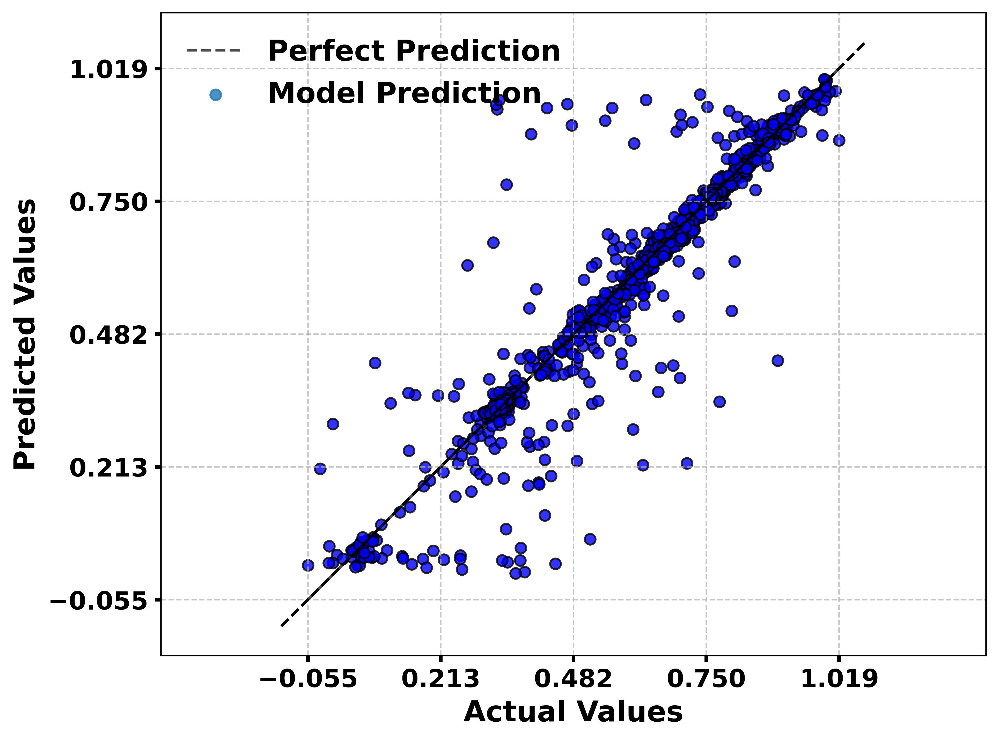

In [62]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import PredictionErrorDisplay

plt.rcParams.update({'font.size': 16})

def plot_predictions(model, X_test_scaled, y_test_scaled):
    predicted = model.predict(X_test_scaled)
    

    display = PredictionErrorDisplay(y_true=y_test_scaled, y_pred=predicted)
    
    fig, ax = plt.subplots(figsize=(8, 6), dpi=500)
    display.plot(kind="actual_vs_predicted", ax=ax)
 
    ax.set_xlabel("Actual Values", fontsize=16, fontweight='bold') 
    ax.set_ylabel("Predicted Values", fontsize=16, fontweight='bold') 

    ax.tick_params(axis='both', which='major', labelsize=14, width=2)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')

    ax.grid(True, linestyle='--', alpha=0.7)
    ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c="black") 
    
    legend = ax.legend(['Perfect Prediction', 'Model Prediction'], loc='upper left', fontsize=16, frameon=False)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    ax.lines[0].set_color('black') 
    ax.collections[0].set_edgecolor('black') 
    ax.collections[0].set_facecolor('blue')

    plt.tight_layout()
    plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\NeuralNetwork.png', dpi=500)
    plt.show()


plot_predictions(model, X_test_scaled, y_test_scaled)

In [63]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

mae = history.history['mae']
val_mae = history.history['val_mae']

mse = history.history['mse']
val_mse = history.history['val_mse']

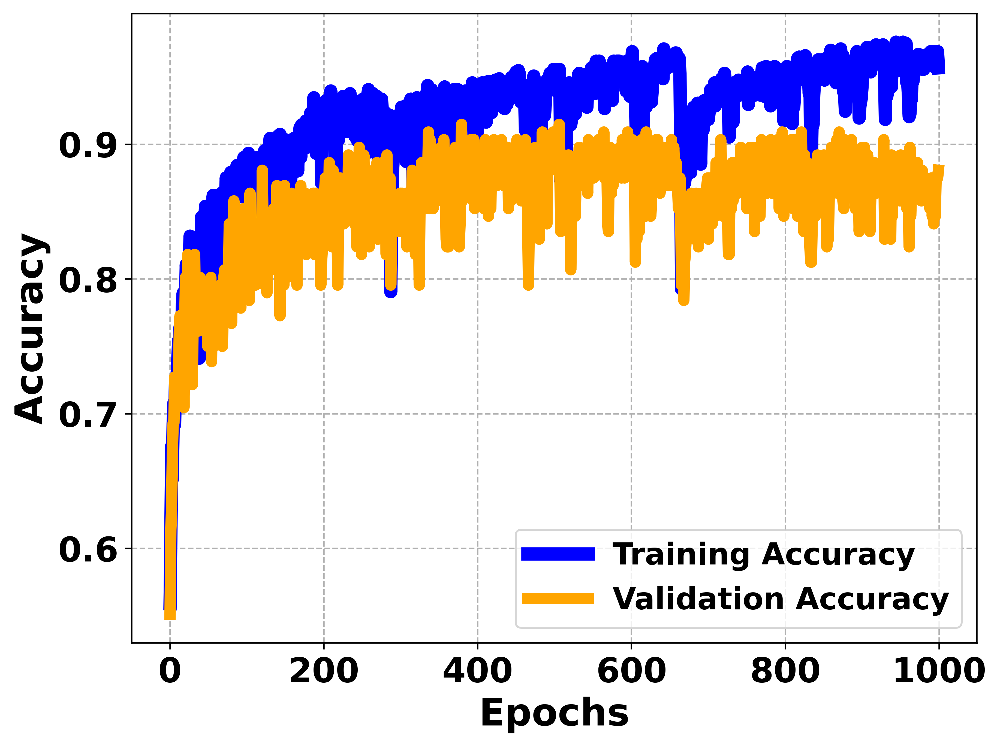

In [64]:

plt.figure(figsize=(8, 6), dpi=500)
plt.plot(accuracy, label='Training Accuracy', color='blue', linewidth=7, alpha=1)
plt.plot(val_accuracy, label='Validation Accuracy', color='orange', linewidth=6, alpha=1)
plt.xlabel('Epochs', fontsize=20, fontweight='bold')
plt.ylabel('Accuracy', fontsize=20, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.legend(fontsize=18, prop={'weight': 'bold'})  
plt.grid(True, linestyle='--', alpha=1)
plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\Accuracy.png', dpi=500)
plt.show()

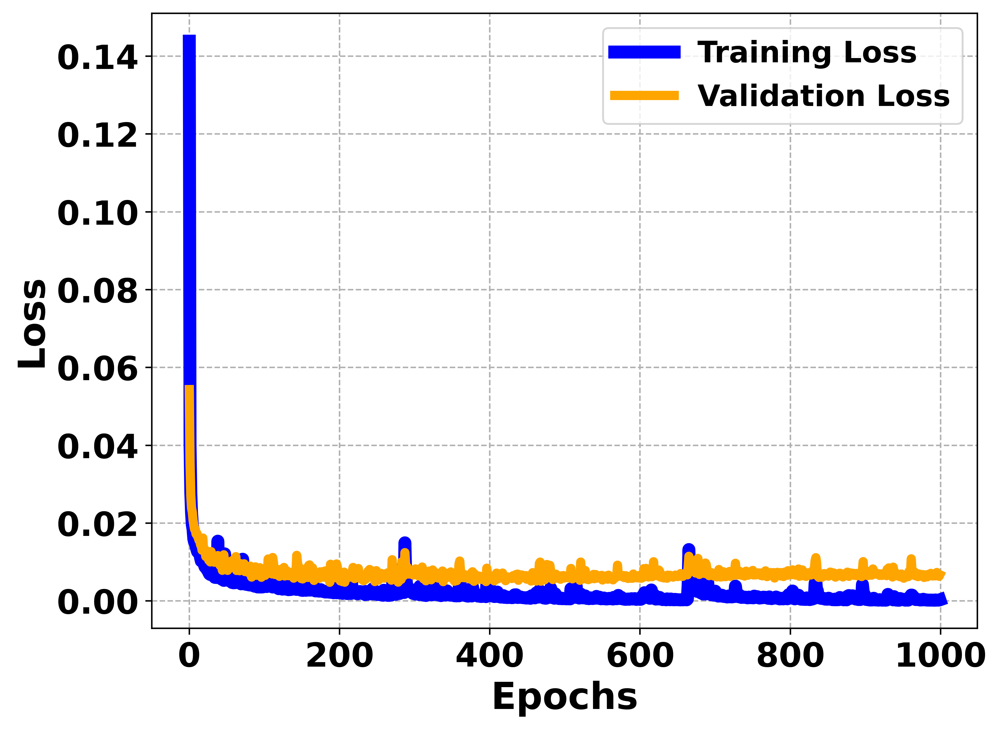

In [65]:
plt.figure(figsize=(8, 6), dpi=500)
plt.plot(loss, label='Training Loss', color='blue', linewidth=7, alpha=1)
plt.plot(val_loss, label='Validation Loss', color='orange', linewidth=5, alpha=1)
plt.xlabel('Epochs', fontsize=20, fontweight='bold')
plt.ylabel('Loss', fontsize=20, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.legend(fontsize=18, prop={'weight': 'bold'}) 
plt.grid(True, linestyle='--', alpha=1)
plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\Loss.png', dpi=500)
plt.show()

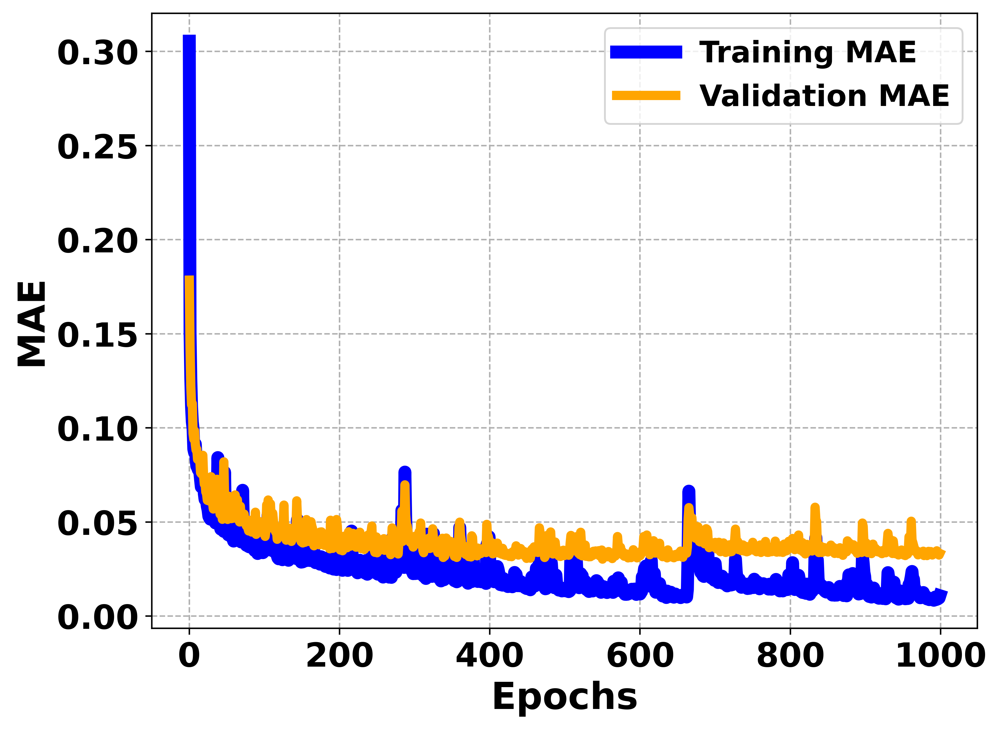

In [66]:
plt.figure(figsize=(8, 6), dpi=500)
plt.plot(mae, label='Training MAE', color='blue', linewidth=7, alpha=1)
plt.plot(val_mae, label='Validation MAE', color='orange', linewidth=5, alpha=1)
plt.xlabel('Epochs', fontsize=20, fontweight='bold')
plt.ylabel('MAE', fontsize=20, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.legend(fontsize=18, prop={'weight': 'bold'})  
plt.grid(True, linestyle='--', alpha=1)
plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\MAE.png', dpi=500)
plt.show()

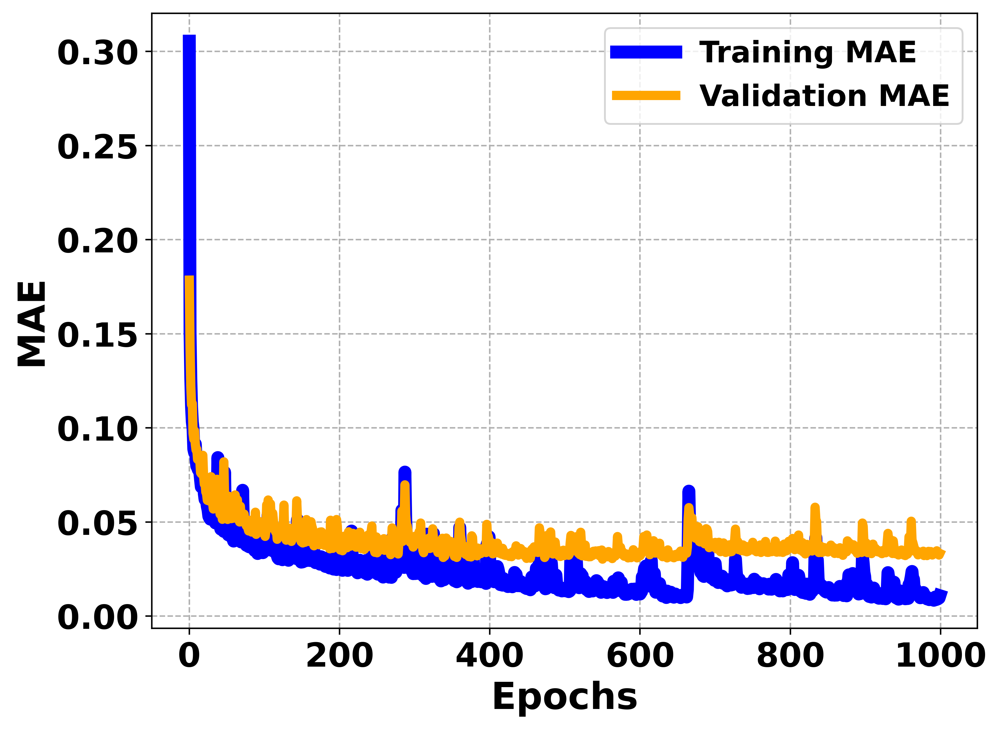

In [67]:
plt.figure(figsize=(8, 6), dpi=500)
plt.plot(mae, label='Training MAE', color='blue', linewidth=7, alpha=1)
plt.plot(val_mae, label='Validation MAE', color='orange', linewidth=5, alpha=1)
plt.xlabel('Epochs', fontsize=20, fontweight='bold')
plt.ylabel('MAE', fontsize=20, fontweight='bold')
plt.xticks(fontsize=18, fontweight='bold')
plt.yticks(fontsize=18, fontweight='bold')
plt.legend(fontsize=18, prop={'weight': 'bold'})  
plt.grid(True, linestyle='--', alpha=1)
plt.savefig(r'C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\MAE.png', dpi=500)
plt.show()

## SK-LEARN

In [68]:
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, explained_variance_score
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
from sklearn.metrics import PredictionErrorDisplay

def print_metrics(fname, bar, model, x_test_scaled, y_test):
    predicted = model.predict(x_test_scaled)

    print(f'\n{bar}\n' + '-' * len(bar))
    
    display = PredictionErrorDisplay(y_true=y_test, y_pred=predicted)
    
    fig, ax = plt.subplots(figsize=(8, 6), dpi=500)
    display.plot(kind="actual_vs_predicted", ax=ax)
     
    ax.set_xlabel("Actual Values", fontsize=16, fontweight='bold') 
    ax.set_ylabel("Predicted Values", fontsize=16, fontweight='bold') 

    ax.tick_params(axis='both', which='major', labelsize=14, width=2)
    for label in ax.get_xticklabels() + ax.get_yticklabels():
        label.set_fontweight('bold')


    ax.grid(True, linestyle='--', alpha=0.7)
    ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c="black") 
    
    legend = ax.legend(['Perfect Prediction', 'Model Prediction'], loc='upper left', fontsize=16, frameon=False)
    for text in legend.get_texts():
        text.set_fontweight('bold')

    ax.lines[0].set_color('black') 
    ax.collections[0].set_edgecolor('black') 
    ax.collections[0].set_facecolor('blue')

    plt.tight_layout()
    plt.savefig(r"C:\Users\KIIT\OneDrive\Documents\RESEARCH_PAPERS\SHARAD\DRAFTS\GHz\MANUSCRIPT\{}.png".format(fname), dpi=500)
    plt.show()
    
    print(f"\033[1mR² Score:\033[0m {r2_score(y_test, predicted):.4f}")
    print(f"\033[1mMean Absolute Error (MAE):\033[0m {mean_absolute_error(y_test, predicted):.4f}")
    print(f"\033[1mMean Squared Error (MSE):\033[0m {mean_squared_error(y_test, predicted):.4f}")
    print(f"\033[1mExplained Variance Score:\033[0m {explained_variance_score(y_test, predicted):.4f}")
    print()

### DUMMY REGRESSOR


Dummy Regressor
---------------


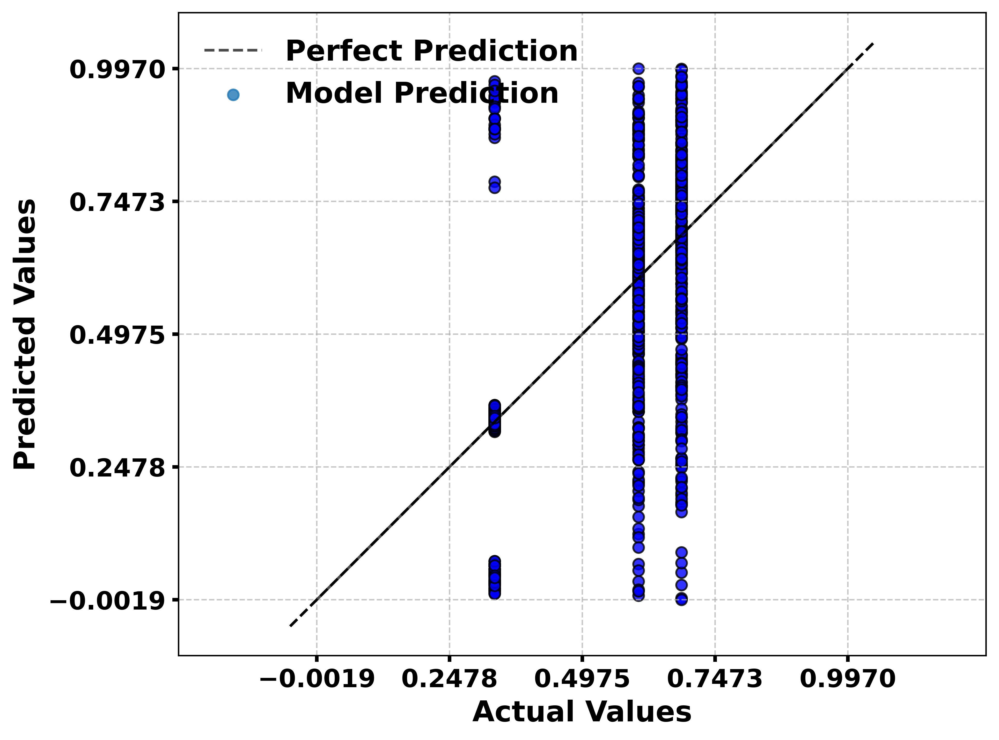

R² Score: -0.0041
Mean Absolute Error (MAE): 0.1264
Mean Squared Error (MSE): 0.0361
Explained Variance Score: -0.0000



In [69]:
from sklearn.dummy import DummyRegressor

dummy_reg = DummyRegressor(strategy="mean")
dummy_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("DummyRegressor", "Dummy Regressor", dummy_reg, X_test_scaled, y_test_scaled)


### LINEAR MODELS

In [70]:
from sklearn import linear_model

Basic


Linear Regression Model
-----------------------


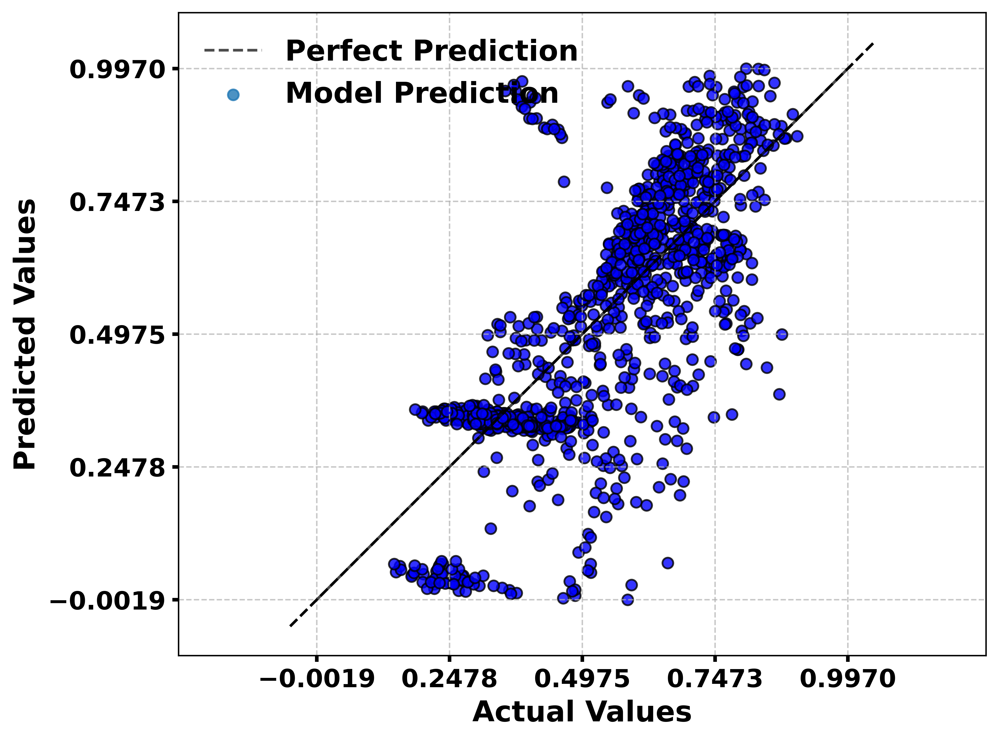

R² Score: 0.2970
Mean Absolute Error (MAE): 0.1161
Mean Squared Error (MSE): 0.0252
Explained Variance Score: 0.2984



In [71]:
linear = linear_model.LinearRegression()
linear.fit(X_train_scaled, y_train_scaled)

print_metrics("LinearRegression", "Linear Regression Model", linear, X_test_scaled, y_test_scaled)

### RIDGE REGRESSION


Ridge Regression Model
----------------------


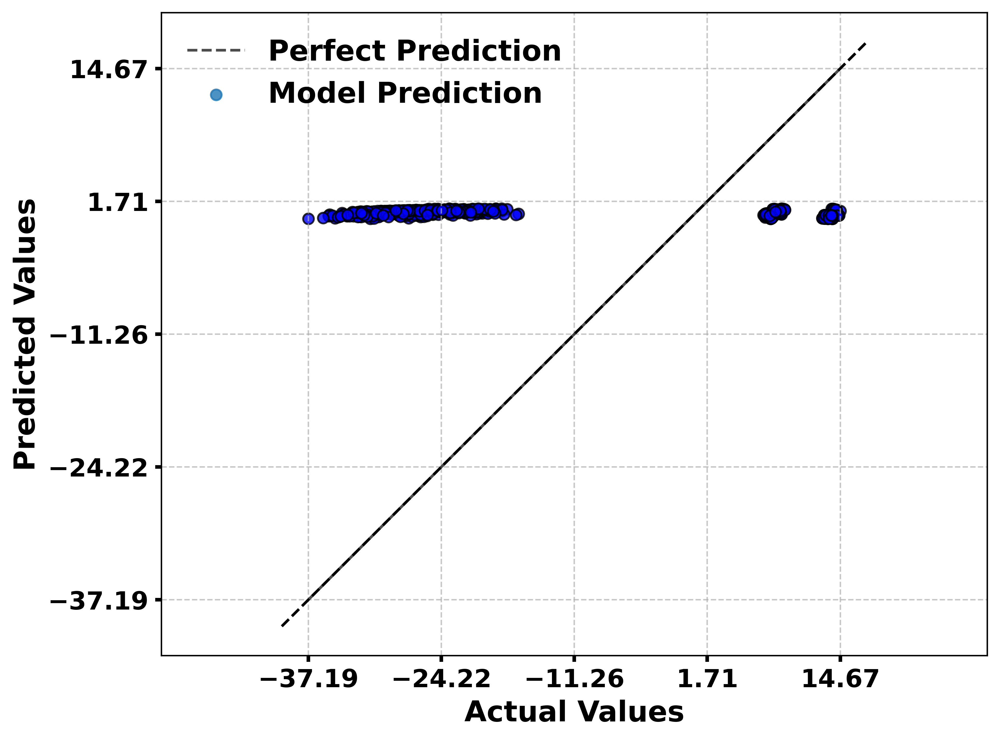

R² Score: -8602.3393
Mean Absolute Error (MAE): 16.0687
Mean Squared Error (MSE): 330.0094
Explained Variance Score: -123.2794



In [72]:
ridge_reg = linear_model.Ridge(alpha=.5)
ridge_reg.fit(X_train_scaled, y_train)

print_metrics("Ridge", "Ridge Regression Model", ridge_reg, X_test_scaled, y_test_scaled)

Bayesian Ridge


Bayesian Ridge Regression Model
-------------------------------


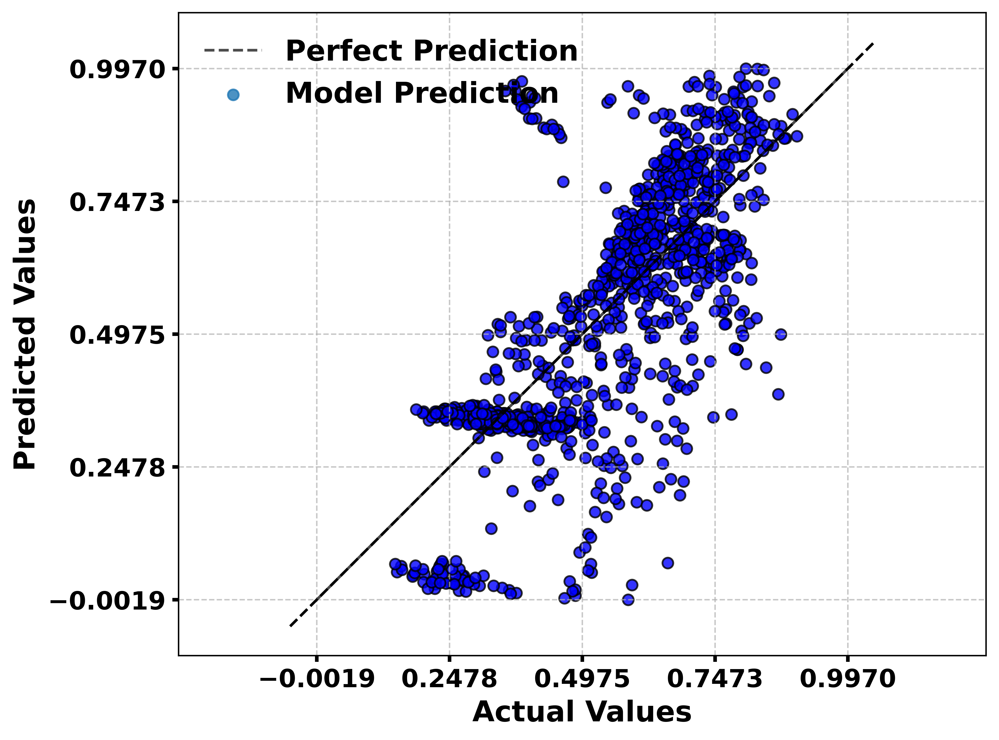

R² Score: 0.2967
Mean Absolute Error (MAE): 0.1160
Mean Squared Error (MSE): 0.0252
Explained Variance Score: 0.2981



In [73]:
from sklearn.multioutput import MultiOutputRegressor, RegressorChain

bayesian_redge_reg = MultiOutputRegressor(linear_model.BayesianRidge())
bayesian_redge_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("LassoLarsBayesianRidge", "Bayesian Ridge Regression Model", bayesian_redge_reg, X_test_scaled, y_test_scaled)

### HIST GRADIENT BOOSTING


Histogram Gradient Boosting Regression Model
--------------------------------------------


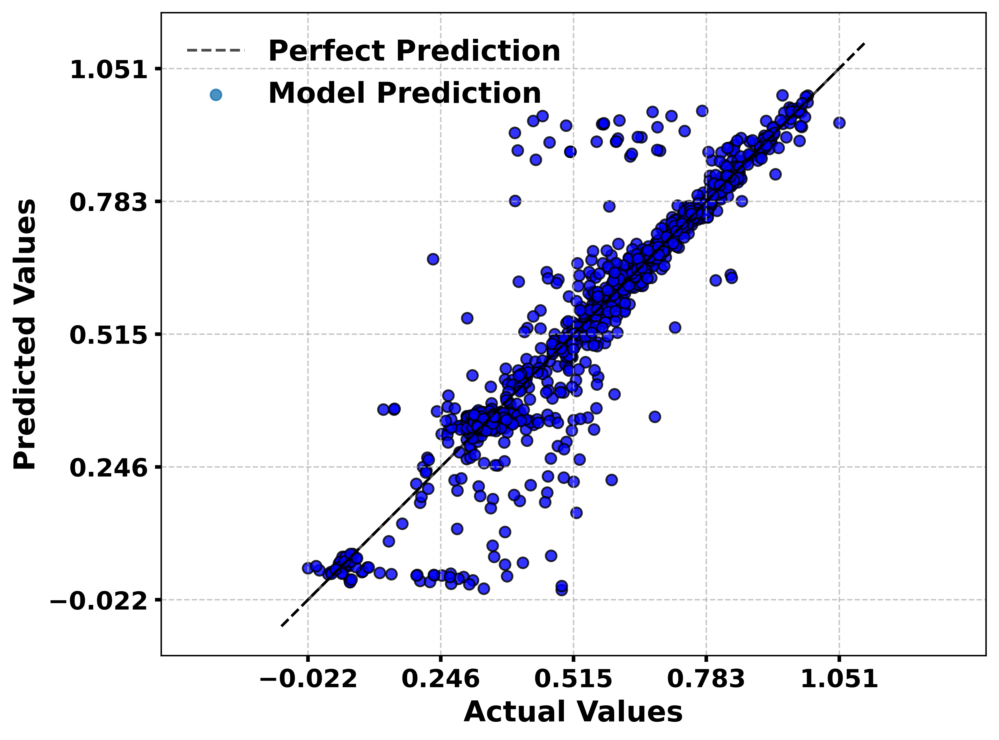

R² Score: 0.7759
Mean Absolute Error (MAE): 0.0423
Mean Squared Error (MSE): 0.0078
Explained Variance Score: 0.7776


Linear Regression with Polynomial Features
------------------------------------------


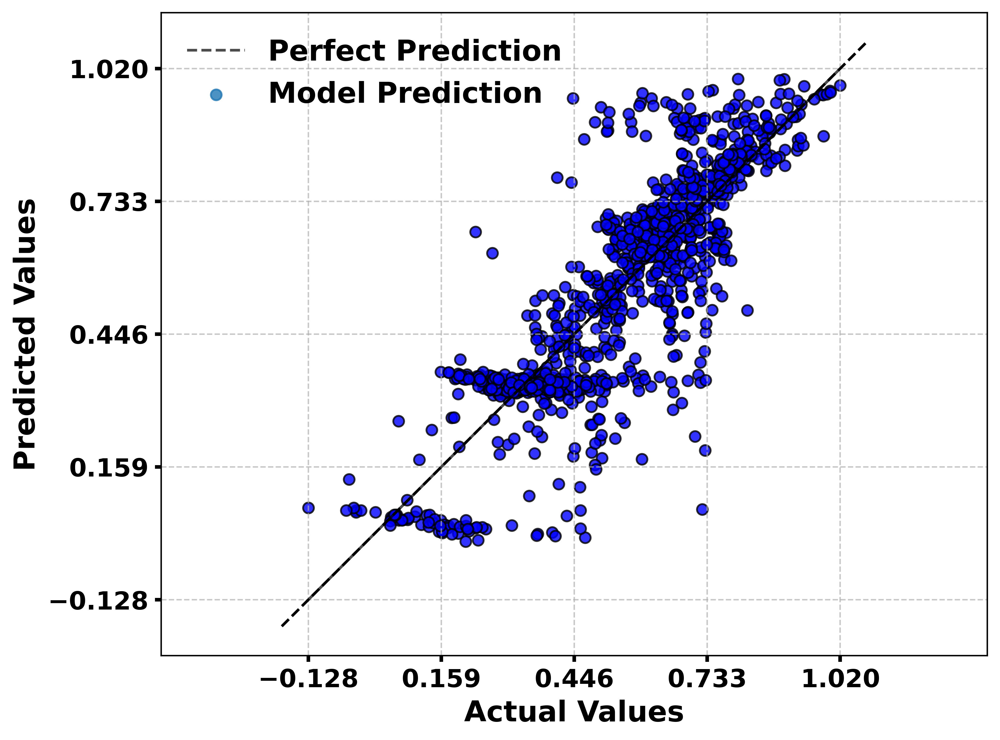

R² Score: 0.5801
Mean Absolute Error (MAE): 0.0845
Mean Squared Error (MSE): 0.0149
Explained Variance Score: 0.5809



In [74]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor

poly = PolynomialFeatures(4)

hgbr_reg = MultiOutputRegressor(HistGradientBoostingRegressor(loss="squared_error", max_leaf_nodes=128))
X_train_poly = poly.fit_transform(X_train_scaled) 
hgbr_reg.fit(X_train_poly, y_train_scaled)

X_test_poly = poly.transform(X_test_scaled)  
print_metrics("HistRegression", "Histogram Gradient Boosting Regression Model", hgbr_reg, X_test_poly, y_test_scaled)

linear_poly = linear_model.LinearRegression(fit_intercept=False)
linear_poly.fit(X_train_poly, y_train_scaled)  

print_metrics("PolynomialRegression", "Linear Regression with Polynomial Features", linear_poly, X_test_poly, y_test_scaled)

### SVM

RBF


Support Vector Regression Model (RBF Kernel)
--------------------------------------------


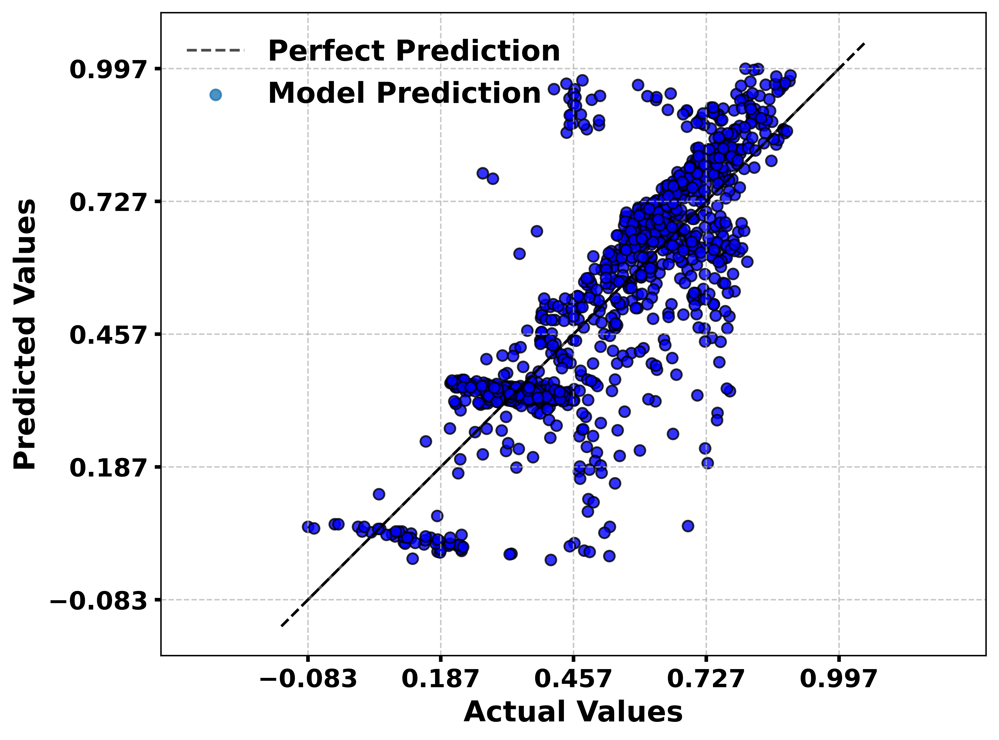

R² Score: 0.4933
Mean Absolute Error (MAE): 0.0958
Mean Squared Error (MSE): 0.0180
Explained Variance Score: 0.4939



In [75]:
from sklearn import svm
from sklearn.multioutput import MultiOutputRegressor

svr_reg = MultiOutputRegressor(svm.SVR(kernel="rbf", C=100, gamma=0.1, epsilon=0.1))
svr_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("SVM[R]", "Support Vector Regression Model (RBF Kernel)", svr_reg, X_test_scaled, y_test_scaled)

LINEAR


Support Vector Regression Model (Linear Kernel)
-----------------------------------------------


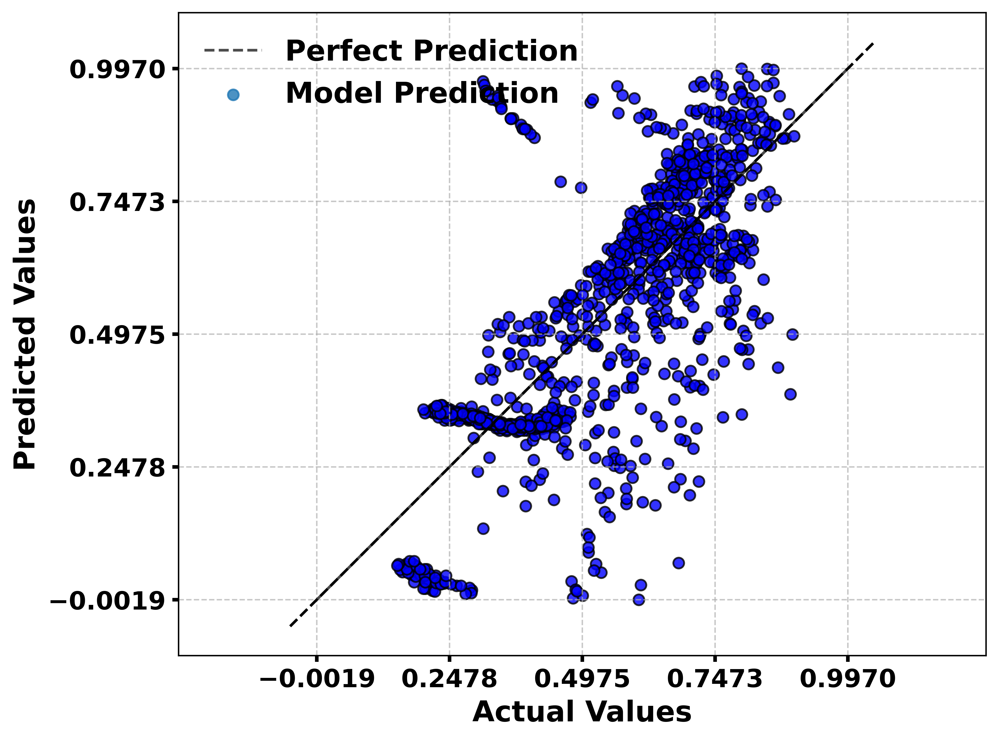

R² Score: 0.2752
Mean Absolute Error (MAE): 0.1157
Mean Squared Error (MSE): 0.0259
Explained Variance Score: 0.2863



In [76]:
from sklearn import svm
from sklearn.multioutput import MultiOutputRegressor

svr_reg = MultiOutputRegressor(svm.SVR(kernel="linear", C=100, gamma="auto"))
svr_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("SVM[L]", "Support Vector Regression Model (Linear Kernel)", svr_reg, X_test_scaled, y_test_scaled)

POLYNOMIAL


Support Vector Regression Model (Polynomial Kernel)
---------------------------------------------------


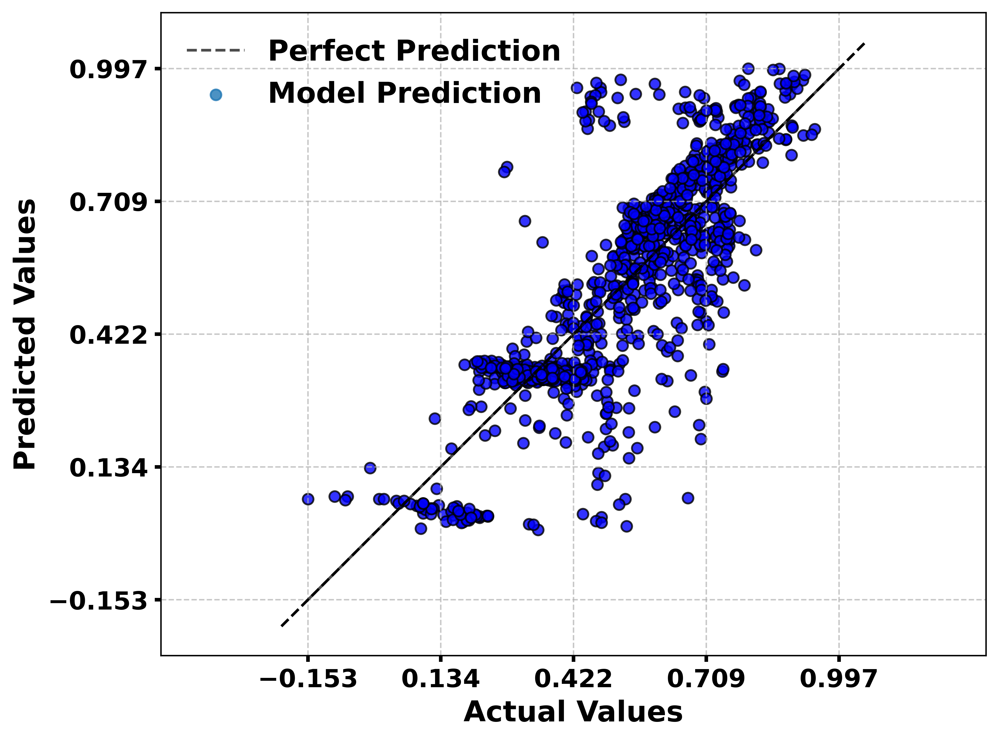

R² Score: 0.5203
Mean Absolute Error (MAE): 0.0930
Mean Squared Error (MSE): 0.0170
Explained Variance Score: 0.5208



In [77]:
from sklearn import svm
from sklearn.multioutput import MultiOutputRegressor

svr_reg = MultiOutputRegressor(svm.SVR(kernel="poly", C=100, gamma="auto", degree=3, epsilon=0.1, coef0=1))
svr_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("SVM[P]", "Support Vector Regression Model (Polynomial Kernel)", svr_reg, X_test_scaled, y_test_scaled)

## KNN


K-Nearest Neighbors Regression Model
------------------------------------


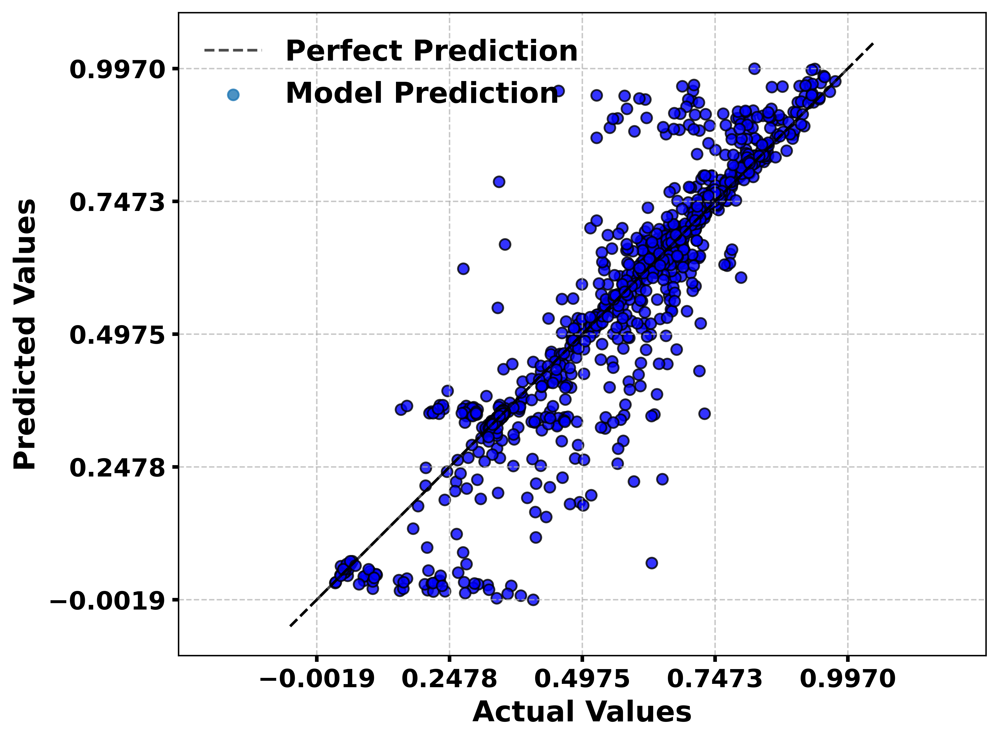

R² Score: 0.7593
Mean Absolute Error (MAE): 0.0490
Mean Squared Error (MSE): 0.0086
Explained Variance Score: 0.7609



In [78]:
from sklearn import neighbors

n_neighbors = 5

knn_reg = neighbors.KNeighborsRegressor(n_neighbors, weights="distance")
knn_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("KNN", "K-Nearest Neighbors Regression Model", knn_reg, X_test_scaled, y_test_scaled)

### DECISION TREE


Decision Tree Regression Model
------------------------------


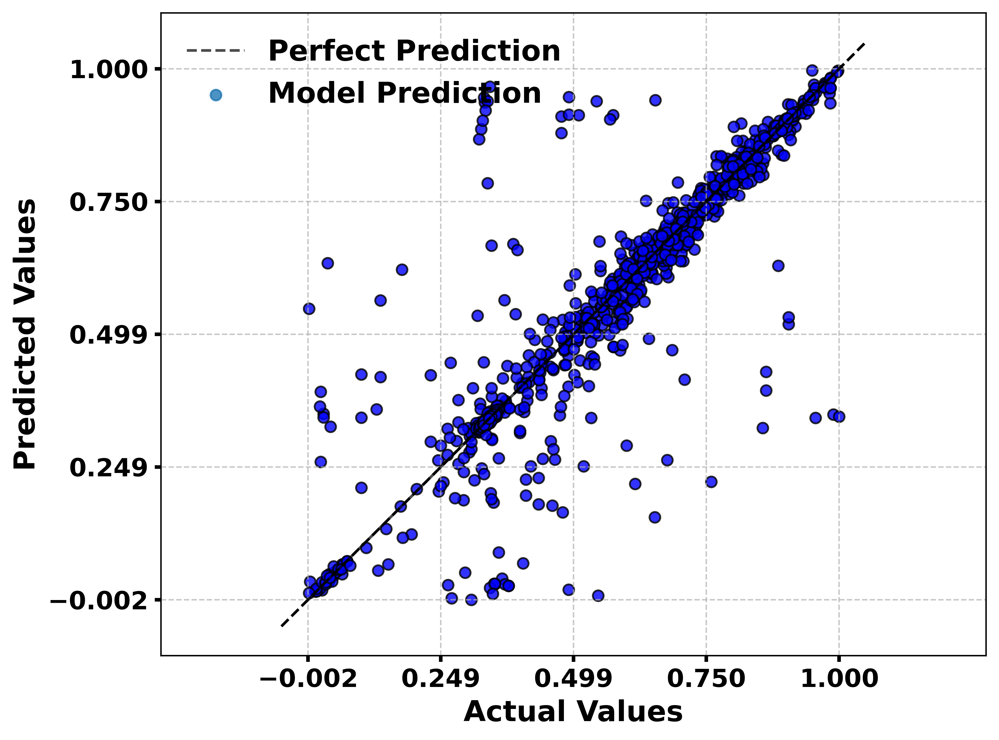

R² Score: 0.6653
Mean Absolute Error (MAE): 0.0426
Mean Squared Error (MSE): 0.0117
Explained Variance Score: 0.6658



In [79]:
from sklearn import tree

clf = tree.DecisionTreeRegressor()
clf.fit(X_train_scaled, y_train_scaled)

print_metrics("DecisionTree", "Decision Tree Regression Model", clf, X_test_scaled, y_test_scaled)

### RANDOM FOREST


Random Forest Regression Model
------------------------------


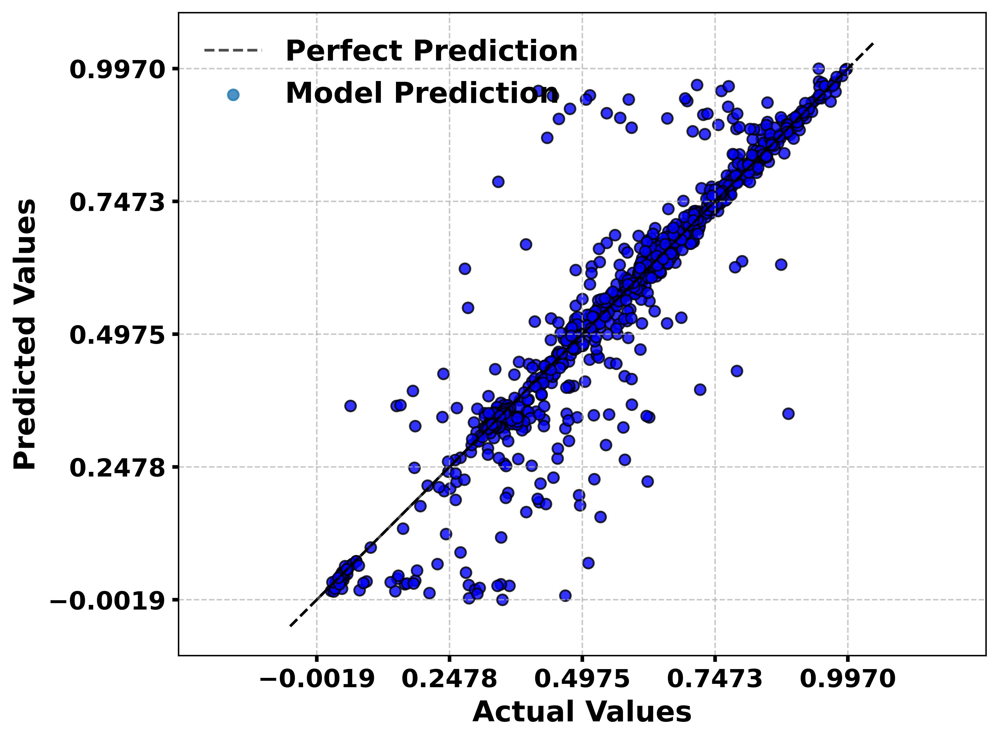

R² Score: 0.8052
Mean Absolute Error (MAE): 0.0351
Mean Squared Error (MSE): 0.0068
Explained Variance Score: 0.8065



In [80]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg.fit(X_train_scaled, y_train_scaled)

print_metrics("RandomForest", "Random Forest Regression Model", rf_reg, X_test_scaled, y_test_scaled)